# Reinforcement Learning Project: Autonomous Taxi Agent Game using Q-learning, SARSA, Deep Q-learning, and Value Iteration

Authors: Prabal Ghosh, Ishfaaq Illahibuccus Sona and Habeeb Hammed

In [12]:
import numpy as np
import gym
import matplotlib.pyplot as plt
env = gym.make('Taxi-v3')

! pip install pygame
!apt-get install -y xvfb python-opengl > /dev/null 2>&1
!pip install gym pyvirtualdisplay > /dev/null 2>&1
!apt-get install xvfb

from matplotlib import animation
from IPython import display
from pyvirtualdisplay import Display
from matplotlib import animation
import math
import random
from collections import namedtuple, deque
from itertools import count
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

/usr/local/lib/python3.11/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.11/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
xvfb is already the newest version (2:21.1.4-2ubuntu1.7~22.04.13).
0 upgraded, 0 newly installed, 0 to remove and 29 not upgraded.


# 1. Q-learning

/usr/local/lib/python3.11/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.11/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.11/dist-packages/gym/utils/passive_env_checker.py:241: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


*******Training Finished*******
Q-table shape: (500, 6)
Q-table:
[[  0.           0.           0.           0.           0.
    0.        ]
 [  0.83792232  -0.87316561  -0.61199004   0.36327012   9.6220697
   -7.44714959]
 [  2.53866045   3.17185624   1.63075093   3.03829294  14.11880599
   -8.41782777]
 ...
 [ -0.61410866  12.89777518  -1.63133221   1.01684714  -8.69960648
   -7.40706052]
 [ -3.25883479  -3.24681714  -3.27295982   4.58716233 -10.54956274
   -9.7850612 ]
 [  0.46319137   2.03176623   1.34067353  17.78115544  -4.06742181
   -2.53461112]]
Average per thousand episodes
1000 :  -253.59099999999998
2000 :  -39.398000000000074
3000 :  1.965999999999995
4000 :  6.020999999999961
5000 :  6.746999999999975
6000 :  7.285999999999959
7000 :  7.229999999999954
8000 :  7.317999999999967
9000 :  7.468999999999967
10000 :  7.310999999999971


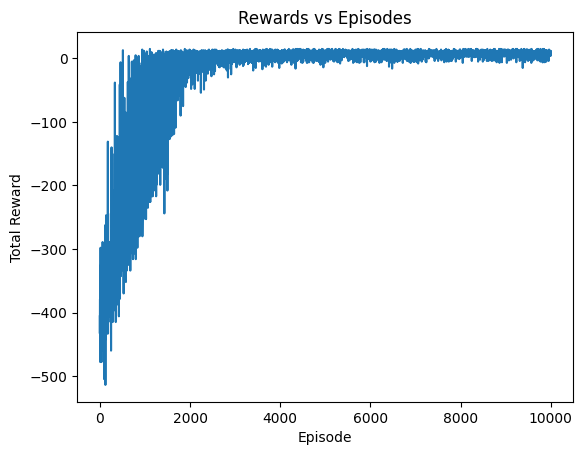

In [13]:
# Initialize the virtual display
d = Display()
d.start()

# Create the taxi environment
env = gym.make('Taxi-v3')

# Q-learning parameters
num_episodes = 10000
max_steps_per_episode = 100
learning_rate = 0.1
discount_rate = 0.99
exploration_rate = 1
max_exploration_rate = 1
min_exploration_rate = 0.01
exploration_decay_rate = 0.001

# Initialize Q-table
actions = env.action_space.n
state = env.observation_space.n
q_table = np.zeros((state, actions))

rewards_all_episodes = []

# Algorithm
for episode in range(num_episodes):
    state = env.reset()
    done = False
    rewards_cur_episode = 0

    for step in range(max_steps_per_episode):
        exploration_threshold = np.random.uniform(0, 1)
        if exploration_threshold > exploration_rate:
            action = np.argmax(q_table[state, :])
        else:
            action = env.action_space.sample()

        next_state, reward, done, info = env.step(action)

        # Update the table
        q_table[state, action] = q_table[state, action] * (1 - learning_rate) + \
                                 learning_rate * (reward + discount_rate * np.max(q_table[next_state, :]))
        state = next_state
        rewards_cur_episode += reward

        if done:
            break

    # Decay epsilon
    exploration_rate = min_exploration_rate + (max_exploration_rate - min_exploration_rate) * np.exp(-exploration_decay_rate * episode)
    rewards_all_episodes.append(rewards_cur_episode)

print("*******Training Finished*******")

# Print Q-table
print("Q-table shape:",q_table.shape)
print("Q-table:")
print(q_table)

rewards_per_1000_episodes = np.split(np.array(rewards_all_episodes), num_episodes / 1000)
cnt = 1000

print("Average per thousand episodes")
for r in rewards_per_1000_episodes:
    print(cnt, ": ", str(sum(r / 1000)))
    cnt += 1000

plt.plot(rewards_all_episodes)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Rewards vs Episodes')
plt.show()


******Reached Goal******


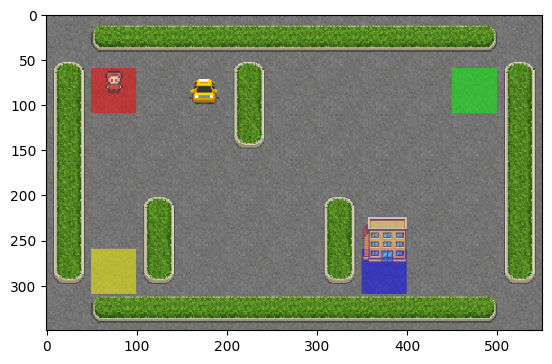

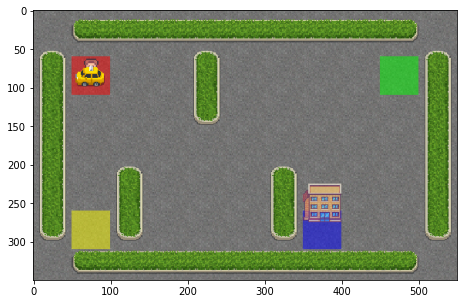

In [6]:
# Animation of the taxi
for episode in range(1):
    state = env.reset()
    done = False
    print("Episode: ", episode)

    prev_screen = env.render(mode='rgb_array')
    plt.imshow(prev_screen)
    img = []
    for step in range(max_steps_per_episode):
        action = np.argmax(q_table[state, :])
        next_state, reward, done, info = env.step(action)

        display.clear_output(wait=True)
        img.append(env.render('rgb_array'))

        if done:
            if reward == 20:
                print("******Reached Goal******")
            else:
                print("******Failed******")
            img.append(env.render('rgb_array'))
            break
        state = next_state

env.close()

dpi = 72
interval = 50  

plt.figure(figsize=(img[0].shape[1] / dpi, img[0].shape[0] / dpi), dpi=dpi)
patch = plt.imshow(img[0])
plt.axes().set_axis_off() 

animate = lambda i: patch.set_data(img[i])
ani = animation.FuncAnimation(plt.gcf(), animate, frames=len(img), interval=interval)
display.display(display.HTML(ani.to_jshtml()))

# 2. SARSA

/usr/local/lib/python3.11/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.11/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.11/dist-packages/gym/utils/passive_env_checker.py:241: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


*******Training Finished*******
Q-table shape: (500, 6)
Q-table:
[[  0.           0.           0.           0.           0.
    0.        ]
 [ -6.09257433  -5.05436052  -8.1896457   -2.76889956   8.4916031
  -14.60491897]
 [ -5.26610625  -4.39177045  -5.14967369  -3.64951522  13.7636515
  -11.12767148]
 ...
 [  4.95967304  14.89512642  -3.63234795   1.09260284  -7.6255435
   -7.21413217]
 [ -8.92541358  -8.24640174  -8.96574761  -8.30014061 -15.8054497
  -16.14083589]
 [ -0.99560904  -0.55646916  -0.84103229  17.58141774  -7.0986476
   -6.03925345]]
Average per thousand episodes
1000 :  -255.72699999999972
2000 :  -60.482000000000056
3000 :  -3.2090000000000143
4000 :  5.439999999999968
5000 :  6.8119999999999665
6000 :  6.925999999999963
7000 :  7.387999999999968
8000 :  7.494999999999958
9000 :  7.2819999999999645
10000 :  7.425999999999971
11000 :  7.3899999999999615
12000 :  7.348999999999965
13000 :  7.308999999999962
14000 :  7.323999999999964
15000 :  7.3179999999999765


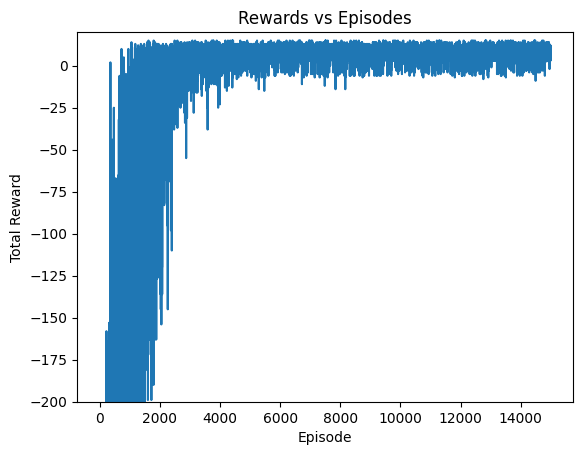

In [ ]:
# Initialize the virtual display
d = Display()
d.start()

# Create the environment
env = gym.make('Taxi-v3')

# SARSA parameters
num_episodes = 15000
max_steps_per_episode = 100
learning_rate = 0.1
discount_rate = 0.99
exploration_rate = 1
max_exploration_rate = 1
min_exploration_rate = 0.01
exploration_decay_rate = 0.001

# Initialize Q-table
actions = env.action_space.n
state = env.observation_space.n
q_table = np.zeros((state, actions))

# List to store rewards
rewards_all_episodes = []

# Algo
for episode in range(num_episodes):
    state = env.reset()
    done = False
    rewards_cur_episode = 0

    # Here we choose action using epsilon-greedy policy
    exploration_threshold = np.random.uniform(0, 1)
    if exploration_threshold > exploration_rate:
        action = np.argmax(q_table[state, :])
    else:
        action = env.action_space.sample()

    for step in range(max_steps_per_episode):
        next_state, reward, done, info = env.step(action)

        # We choose next action using same policy
        exploration_threshold = np.random.uniform(0, 1)
        if exploration_threshold > exploration_rate:
            next_action = np.argmax(q_table[next_state, :])
        else:
            next_action = env.action_space.sample()

        # Update the q-table
        q_table[state, action] = q_table[state, action] * (1 - learning_rate) + \
                                 learning_rate * (reward + discount_rate * q_table[next_state, next_action])

        state = next_state
        action = next_action
        rewards_cur_episode += reward

        if done:
            break

    # Decay epsilon
    exploration_rate = min_exploration_rate + (max_exploration_rate - min_exploration_rate) * np.exp(-exploration_decay_rate * episode)
    rewards_all_episodes.append(rewards_cur_episode)

print("*******Training Finished*******")

# Print Q-table
print("Q-table shape:", q_table.shape)
print("Q-table:")
print(q_table)

rewards_per_1000_episodes = np.split(np.array(rewards_all_episodes), num_episodes / 1000)
cnt = 1000

print("Average per thousand episodes")
for r in rewards_per_1000_episodes:
    print(cnt, ": ", str(sum(r / 1000)))
    cnt += 1000

plt.plot(rewards_all_episodes)
plt.xlabel('Episode')
plt.ylabel('Total Reward')
plt.title('Rewards vs Episodes')
plt.ylim(-200, 20)  
plt.show()

******Reached Goal******


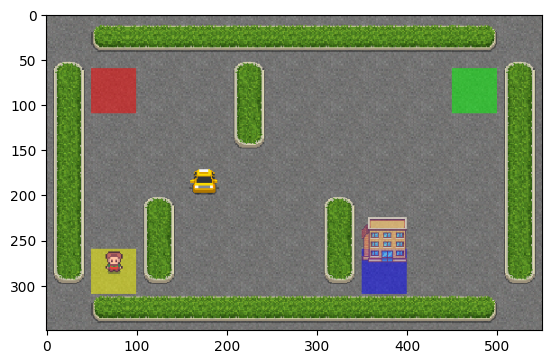

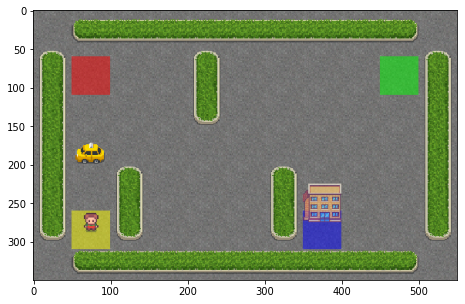

In [ ]:
# Animation of the taxi
for episode in range(1):
    state = env.reset()
    done = False
    print("Episode: ", episode)

    prev_screen = env.render(mode='rgb_array')
    plt.imshow(prev_screen)
    img = []
    for step in range(max_steps_per_episode):
        action = np.argmax(q_table[state, :])
        next_state, reward, done, info = env.step(action)

        display.clear_output(wait=True)
        img.append(env.render('rgb_array'))

        if done:
            if reward == 20:
                print("******Reached Goal******")
            else:
                print("******Failed******")
            img.append(env.render('rgb_array'))
            break
        state = next_state

env.close()

dpi = 72
interval = 50  

plt.figure(figsize=(img[0].shape[1] / dpi, img[0].shape[0] / dpi), dpi=dpi)
patch = plt.imshow(img[0])
plt.axes().set_axis_off()  

animate = lambda i: patch.set_data(img[i])
ani = animation.FuncAnimation(plt.gcf(), animate, frames=len(img), interval=interval)
display.display(display.HTML(ani.to_jshtml()))

In [ ]:
!pip install pyvirtualdisplay

# 3. Value Iteration

/usr/local/lib/python3.11/dist-packages/gym/core.py:317: DeprecationWarning: WARN: Initializing wrapper in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(
/usr/local/lib/python3.11/dist-packages/gym/wrappers/step_api_compatibility.py:39: DeprecationWarning: WARN: Initializing environment in old step API which returns one bool instead of two. It is recommended to set `new_step_api=True` to use new step API. This will be the default behaviour in future.
  deprecation(


Value Iteration converged in 725 iterations.


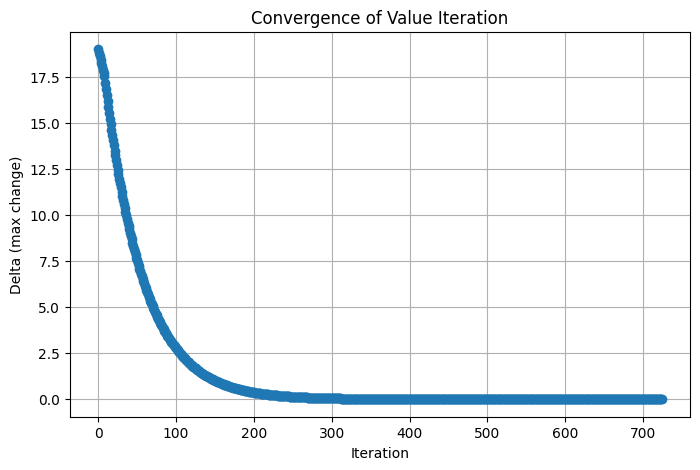

/usr/local/lib/python3.11/dist-packages/gym/core.py:43: DeprecationWarning: WARN: The argument mode in render method is deprecated; use render_mode during environment initialization instead.
See here for more information: https://www.gymlibrary.ml/content/api/
  deprecation(
/usr/local/lib/python3.11/dist-packages/gym/utils/passive_env_checker.py:241: DeprecationWarning: `np.bool8` is a deprecated alias for `np.bool_`.  (Deprecated NumPy 1.24)
  if not isinstance(terminated, (bool, np.bool8)):


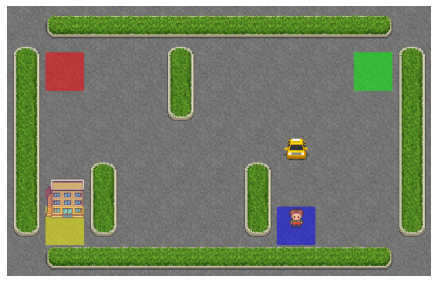

In [ ]:
display = Display(visible=0, size=(1400, 900))
display.start()

env = gym.make('Taxi-v3')

num_states = env.observation_space.n
num_actions = env.action_space.n

# Hyperparameters
gamma = 0.99       
theta = 1e-5       #threshold to monitor the convergence of our algo

# We initialize the values for all states=0
V = np.zeros(num_states)

deltas = []

# Algorithm
iteration = 0
average_rewards = []
eval_interval = 10

while True:
    delta = 0
    for s in range(num_states):
        v = V[s]
        q_sa = np.zeros(num_actions)
        for a in range(num_actions):
            for prob, next_state, reward, done in env.P[s][a]:
                q_sa[a] += prob * (reward + gamma * V[next_state])
        V[s] = np.max(q_sa)
        delta = max(delta, abs(v - V[s]))
    deltas.append(delta)
    iteration += 1
    if delta < theta:
        break

print(f"Value Iteration converged in {iteration} iterations.")

# Optimal policy
policy = np.zeros(num_states, dtype=int)
for s in range(num_states):
    q_sa = np.zeros(num_actions)
    for a in range(num_actions):
        for prob, next_state, reward, done in env.P[s][a]:
            q_sa[a] += prob * (reward + gamma * V[next_state])
    policy[s] = np.argmax(q_sa)

plt.figure(figsize=(8, 5))
plt.plot(deltas, marker='o')
plt.xlabel("Iteration")
plt.ylabel("Delta (max change)")
plt.title("Convergence of Value Iteration")
plt.grid(True)
plt.show()


# Animation
frames = []

reset_output = env.reset()
if isinstance(reset_output, tuple):
    state = reset_output[0]
else:
    state = reset_output

done = False

frames.append(env.render(mode='rgb_array'))

while not done:
    action = policy[state]
    state, reward, done, info = env.step(action)
    frames.append(env.render(mode='rgb_array'))

env.close()

# We display the taxi here
dpi = 72
interval = 200

plt.figure(figsize=(frames[0].shape[1] / dpi, frames[0].shape[0] / dpi), dpi=dpi)
patch = plt.imshow(frames[0])
plt.axis('off')

def animate_func(i):
    patch.set_data(frames[i])
    return [patch]

anim = animation.FuncAnimation(plt.gcf(), animate_func, frames=len(frames), interval=interval)
ipy_display.display(ipy_display.HTML(anim.to_jshtml()))


# 4. Deep Q learning

In [ ]:
import matplotlib

In [ ]:
env = gym.make("Taxi-v3")

is_ipython = 'inline' in matplotlib.get_backend()
plt.ion()

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Transition = namedtuple('Transition', ('state', 'action', 'next_state', 'reward'))

class ReplayMemory(object):
    def __init__(self, capacity):
        self.memory = deque([], maxlen=capacity)

    def push(self, *args):
        """Save a transition."""
        self.memory.append(Transition(*args))

    def sample(self, batch_size):
        return random.sample(self.memory, batch_size)

    def __len__(self):
        return len(self.memory)

class DQN(nn.Module):
    # We keep the neural network simple since we're dealing with a relatively simple environment here
    def __init__(self, n_observations, n_actions):
        super(DQN, self).__init__()
        self.layer1 = nn.Linear(n_observations, 128)
        self.layer2 = nn.Linear(128, 128)
        self.layer3 = nn.Linear(128, n_actions)

    def forward(self, x):
        x = F.relu(self.layer1(x))
        x = F.relu(self.layer2(x))
        return self.layer3(x)

def one_hot(state, n):
    # convert the states using 1-hot encoding
    x = torch.zeros(1, n, device=device, dtype=torch.float32)
    x[0, state] = 1.0
    return x

In [ ]:
# Hyperparameters of our NN
BATCH_SIZE = 128
GAMMA = 0.99
EPS_START = 0.9
EPS_END = 0.05
EPS_DECAY = 300
TAU = 0.005
LR = 1e-4

n_actions = env.action_space.n           
n_observations = env.observation_space.n   

# Initialising the networks
policy_net = DQN(n_observations, n_actions).to(device)
target_net = DQN(n_observations, n_actions).to(device)
target_net.load_state_dict(policy_net.state_dict())

optimizer = optim.AdamW(policy_net.parameters(), lr=LR, amsgrad=True)
memory = ReplayMemory(10000)

steps_done = 0

def select_action(state):
    global steps_done
    sample = random.random()
    eps_threshold = EPS_END + (EPS_START - EPS_END) * math.exp(-1. * steps_done / EPS_DECAY) # decay eps
    steps_done += 1
    
    # explore or exploit
    if sample > eps_threshold:
        with torch.no_grad():
            return policy_net(state).max(1).indices.view(1, 1)
    else:
        return torch.tensor([[env.action_space.sample()]], device=device, dtype=torch.long)

def optimize_model():
    if len(memory) < BATCH_SIZE:
        return
    transitions = memory.sample(BATCH_SIZE)
    batch = Transition(*zip(*transitions))

    non_final_mask = torch.tensor(tuple(map(lambda s: s is not None, batch.next_state)),
                                    device=device, dtype=torch.bool)
    non_final_next_states = torch.cat([s for s in batch.next_state if s is not None])
    state_batch = torch.cat(batch.state)
    action_batch = torch.cat(batch.action)
    reward_batch = torch.cat(batch.reward)

    state_action_values = policy_net(state_batch).gather(1, action_batch)

    next_state_values = torch.zeros(BATCH_SIZE, device=device)
    with torch.no_grad():
        next_state_values[non_final_mask] = target_net(non_final_next_states).max(1).values
    expected_state_action_values = (next_state_values * GAMMA) + reward_batch

    loss = F.smooth_l1_loss(state_action_values, expected_state_action_values.unsqueeze(1))

    optimizer.zero_grad() # Optim
    loss.backward() # Backprop
    
    #Clip grads
    torch.nn.utils.clip_grad_value_(policy_net.parameters(), 100)
    optimizer.step()

Episode 100: Average Reward (last 100 episodes) = -126.28
Episode 200: Average Reward (last 100 episodes) = -112.96
Episode 300: Average Reward (last 100 episodes) = -113.41
Episode 400: Average Reward (last 100 episodes) = -115.57
Episode 500: Average Reward (last 100 episodes) = -113.5
Episode 600: Average Reward (last 100 episodes) = -110.03
Episode 700: Average Reward (last 100 episodes) = -112.87
Episode 800: Average Reward (last 100 episodes) = -110.68
Episode 900: Average Reward (last 100 episodes) = -110.89
Episode 1000: Average Reward (last 100 episodes) = -111.26
Episode 1100: Average Reward (last 100 episodes) = -110.71
Episode 1200: Average Reward (last 100 episodes) = -105.82
Episode 1300: Average Reward (last 100 episodes) = -105.01
Episode 1400: Average Reward (last 100 episodes) = -101.35
Episode 1500: Average Reward (last 100 episodes) = -105.61
Episode 1600: Average Reward (last 100 episodes) = -108.4
Episode 1700: Average Reward (last 100 episodes) = -104.98
Episode 

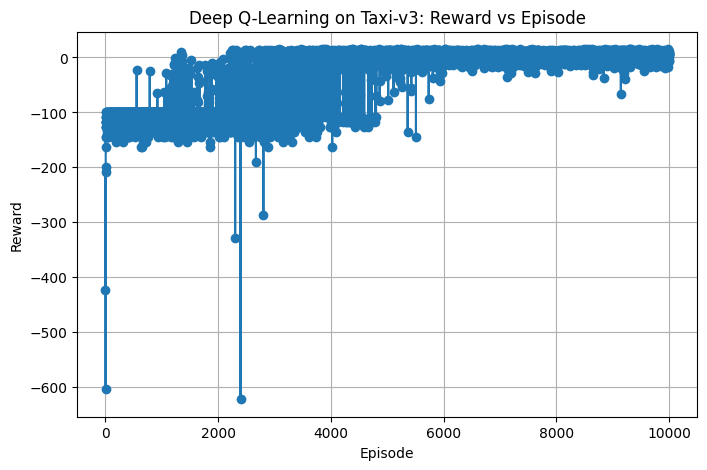

In [28]:
# Training params
num_episodes = 10000
max_steps_per_episode = 100

episode_rewards = []

for i_episode in range(num_episodes):
    state = env.reset()
    state = one_hot(state, n_observations)
    cumulative_reward = 0

    for t in range(max_steps_per_episode):
        action = select_action(state)
        observation, reward, done, info = env.step(action.item())
        cumulative_reward += reward
        reward_tensor = torch.tensor([reward], device=device)

        if done:
            next_state = None
        else:
            next_state = one_hot(observation, n_observations)

        memory.push(state, action, next_state, reward_tensor)
        state = next_state

        optimize_model()

        target_net_state_dict = target_net.state_dict()
        policy_net_state_dict = policy_net.state_dict()
        for key in policy_net_state_dict:
            target_net_state_dict[key] = policy_net_state_dict[key] * TAU + target_net_state_dict[key] * (1 - TAU)
        target_net.load_state_dict(target_net_state_dict)

        if done:
            break

    episode_rewards.append(cumulative_reward)

    if (i_episode + 1) % 100 == 0:
        avg_reward = sum(episode_rewards[-100:]) / 100
        print(f"Episode {i_episode + 1}: Average Reward (last 100 episodes) = {avg_reward}")

print('Training Complete')

plt.figure(figsize=(8, 5))
plt.plot(episode_rewards, marker='o')
plt.xlabel('Episode')
plt.ylabel('Reward')
plt.title('Deep Q-Learning on Taxi-v3: Reward vs Episode')
plt.grid(True)
plt.show()